# Visualisations

In [1]:
import torchvision
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.transforms import ToTensor
import torch.nn.functional as F

In [310]:
wandb.__version__

'0.10.33'

In [6]:
data = '/home/niklas/Internal_HDD/project_data/histopathology/CPTAC/CPTAC_BRCA/tiles'

In [7]:
ds = ImageFolder(data)

In [8]:
ds

Dataset ImageFolder
    Number of datapoints: 724363
    Root location: /home/niklas/Internal_HDD/project_data/histopathology/CPTAC/CPTAC_BRCA/tiles

In [9]:
tsfm = ToTensor()
img_list = []
for i in range(10):
    img_list.append(tsfm(ds[i][0]))

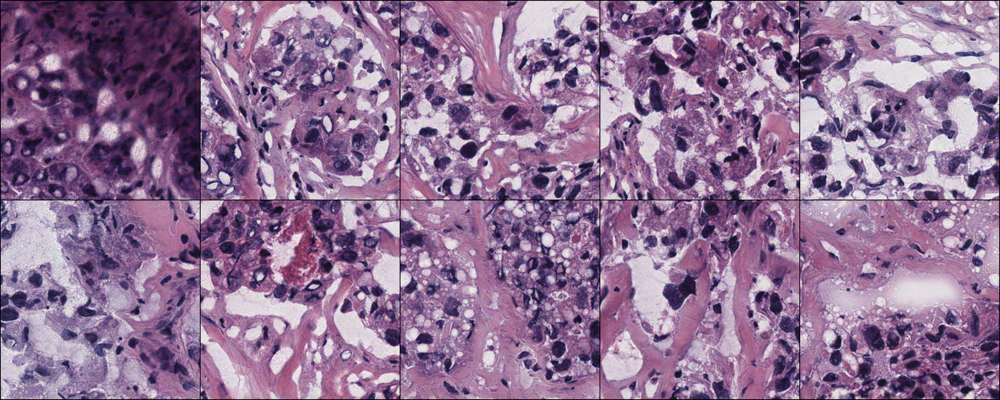

In [10]:
to_pil = torchvision.transforms.ToPILImage()
to_pil(make_grid(img_list, nrow=5))

In [19]:
t = img_list[0]

In [23]:
int((1000 - t.shape[-1])/2)

244

In [2]:
import torch

In [42]:
global_crops = torch.rand(2, 3, 224, 224)
local_crops  = torch.rand(8, 3, 96, 96)

In [43]:
int((224-96)/2)

64

In [47]:
padded_local_crops = F.pad(local_crops, [64]*4, value=1)

In [52]:
make_grid(torch.cat([global_crops, padded_local_crops]), nrow=10)

torch.Size([3, 228, 2262])

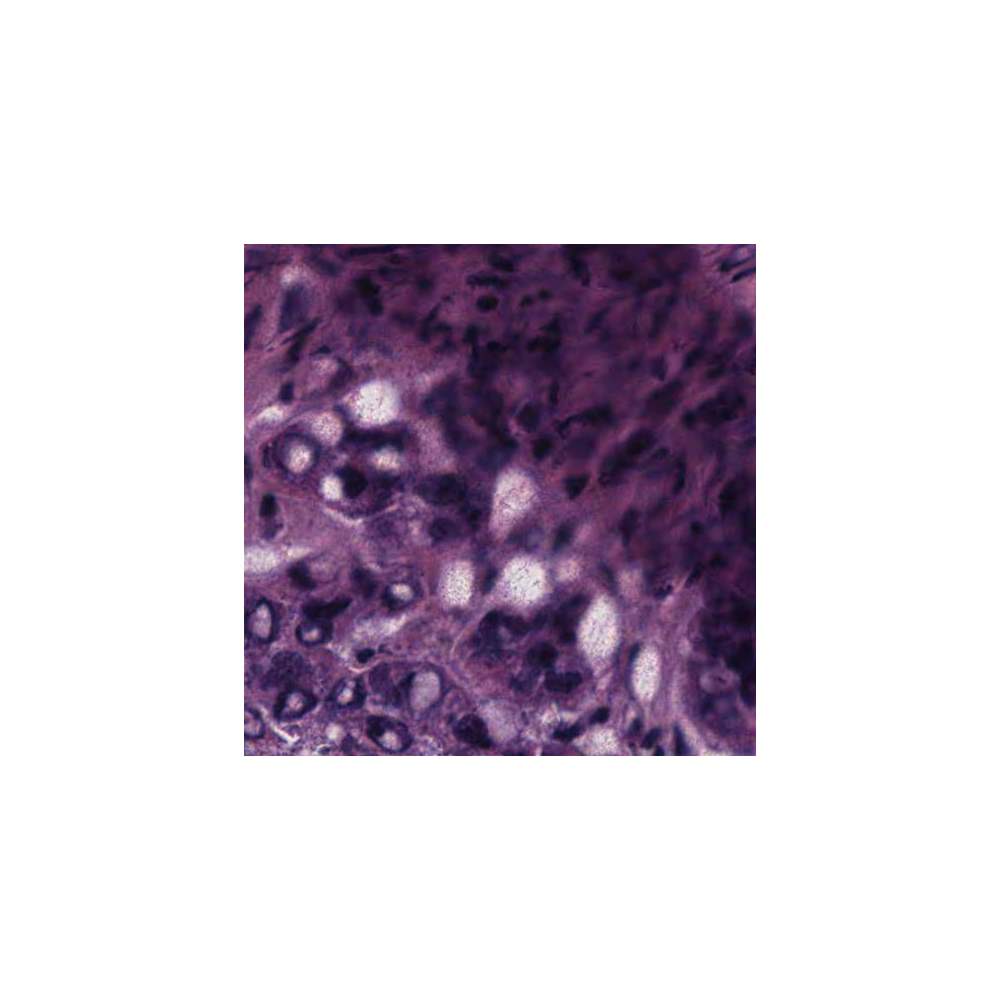

In [36]:
to_pil(img)

In [75]:
values, indices = torch.topk(torch.rand(1, 65000), k=10, dim=-1)

values = values.flatten().tolist()
indices = indices.flatten().tolist()

data = [[idx, val] for (idx, val) in zip(indices, values)]
table = wandb.Table(data=data, columns = ["Class Idx", "Activation"])
wandb.log({"Top-K Class Predictions" : wandb.plot.bar(table, "class", "activation")})

In [3]:
import numpy as np

In [4]:
import matplotlib.pyplot as plt

In [69]:
out.indices

tensor([[44565, 58691, 40058, 31586, 59611, 44197,  5042, 32593, 44404, 12284]])

In [30]:
import matplotlib.pyplot as plt

In [31]:
import torch

In [6]:
a = torch.softmax(torch.rand(1, 60000), dim=-1)

In [33]:
t = torch.rand(16, 60000)

In [40]:
vals, inds = torch.topk(t, k=100, dim=1)

In [41]:
classes, counts = inds.flatten().unique(return_counts=True)

In [42]:
t

tensor([[0.6432, 0.9475, 0.5670,  ..., 0.5225, 0.6426, 0.9557],
        [0.3862, 0.4495, 0.6640,  ..., 0.3160, 0.1984, 0.0768],
        [0.9243, 0.1408, 0.5406,  ..., 0.7618, 0.4675, 0.4331],
        ...,
        [0.4004, 0.2825, 0.5915,  ..., 0.4831, 0.4443, 0.6731],
        [0.8370, 0.5448, 0.3350,  ..., 0.3973, 0.0962, 0.8004],
        [0.1775, 0.7996, 0.6411,  ..., 0.5318, 0.8717, 0.4697]])

In [84]:
import torch.nn.functional as F
from torch import nn

In [85]:
def js_div(p_logits, q_logits):
    
    KLDivLoss = nn.KLDivLoss(reduction='batchmean')
   
    p_output = F.softmax(p_logits, dim=-1)
    q_output = F.softmax(q_logits, dim=-1)
    
    log_mean_output = ((p_output + q_output )/2).log()
    
    return (KLDivLoss(log_mean_output, p_output) + KLDivLoss(log_mean_output, q_output))/2

In [134]:
loss = nn.CrossEntropyLoss()

In [208]:
a = torch.rand(1, 65000)
b = torch.rand(1, 65000)

In [209]:
cosine_distance(a, a)

tensor([[-4.7684e-07]])

In [153]:
def cross_entropy(logits, logits_target):
    return torch.sum(-F.softmax(logits_target, dim=1) * F.log_softmax(logits, dim=1))

In [213]:
a = torch.rand(16, 10)
bs = a.shape[0]

In [199]:
norm = a.norm(dim=1)*a.norm(dim=1)
eps = torch.zeros_like(norm)+1e-8

In [202]:
b = a/torch.max(norm, eps).unsqueeze(1)

In [214]:
similarity = a.T @ a

In [239]:
similarity_matrix = F.cosine_similarity(a[:,:,None], a.t()[None,:,:])

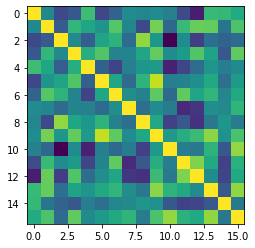

In [243]:
plt.imshow(similarity_matrix)

<AxesSubplot:>

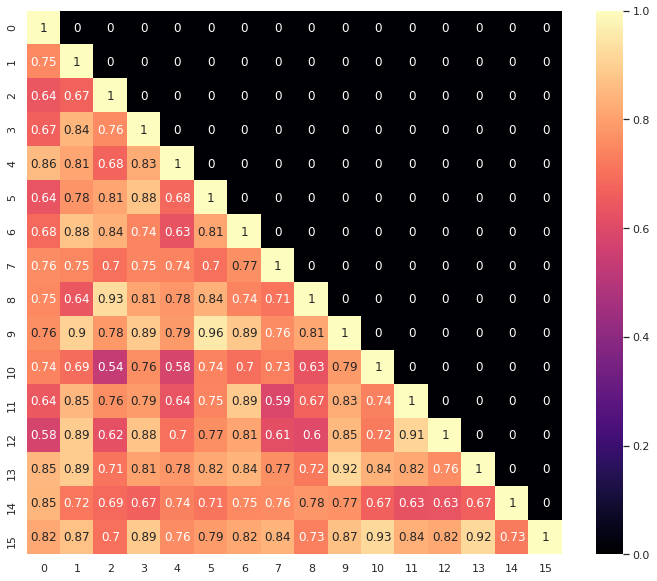

In [315]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(similarity_matrix.tril(), annot=True, cmap='magma')

In [327]:
img = Image.open('./heatmaps/heatmap.png')

(1000, 1200, 4)

In [325]:
from PIL import Image

In [326]:
fig2img(fig)

<ipython-input-324-c39d78d38246>:12: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  buf = np.fromstring ( fig.canvas.tostring_argb(), dtype=np.uint8 )


AttributeError: module 'PIL.Image' has no attribute 'fromstring'

In [314]:
fig.savefig('./test.png')

In [151]:
cross_entropy(torch.tensor([[1.,2.,3.]]), torch.tensor([[1.,2.,3.]]))

tensor(0.8324)

In [152]:
cross_entropy(a, b)

tensor(11.1237)

In [252]:
similarity_matrix.numpy().round(2)

array([[1.  , 0.75, 0.64, 0.67, 0.86, 0.64, 0.68, 0.76, 0.75, 0.76, 0.74,
        0.64, 0.58, 0.85, 0.85, 0.82],
       [0.75, 1.  , 0.67, 0.84, 0.81, 0.78, 0.88, 0.75, 0.64, 0.9 , 0.69,
        0.85, 0.89, 0.89, 0.72, 0.87],
       [0.64, 0.67, 1.  , 0.76, 0.68, 0.81, 0.84, 0.7 , 0.93, 0.78, 0.54,
        0.76, 0.62, 0.71, 0.69, 0.7 ],
       [0.67, 0.84, 0.76, 1.  , 0.83, 0.88, 0.74, 0.75, 0.81, 0.89, 0.76,
        0.79, 0.88, 0.81, 0.67, 0.89],
       [0.86, 0.81, 0.68, 0.83, 1.  , 0.68, 0.63, 0.74, 0.78, 0.79, 0.58,
        0.64, 0.7 , 0.78, 0.74, 0.76],
       [0.64, 0.78, 0.81, 0.88, 0.68, 1.  , 0.81, 0.7 , 0.84, 0.96, 0.74,
        0.75, 0.77, 0.82, 0.71, 0.79],
       [0.68, 0.88, 0.84, 0.74, 0.63, 0.81, 1.  , 0.77, 0.74, 0.89, 0.7 ,
        0.89, 0.81, 0.84, 0.75, 0.82],
       [0.76, 0.75, 0.7 , 0.75, 0.74, 0.7 , 0.77, 1.  , 0.71, 0.76, 0.73,
        0.59, 0.61, 0.77, 0.76, 0.84],
       [0.75, 0.64, 0.93, 0.81, 0.78, 0.84, 0.74, 0.71, 1.  , 0.81, 0.63,
        0.67, 0.6 , 0.

In [257]:
import wandb
import seaborn as sns

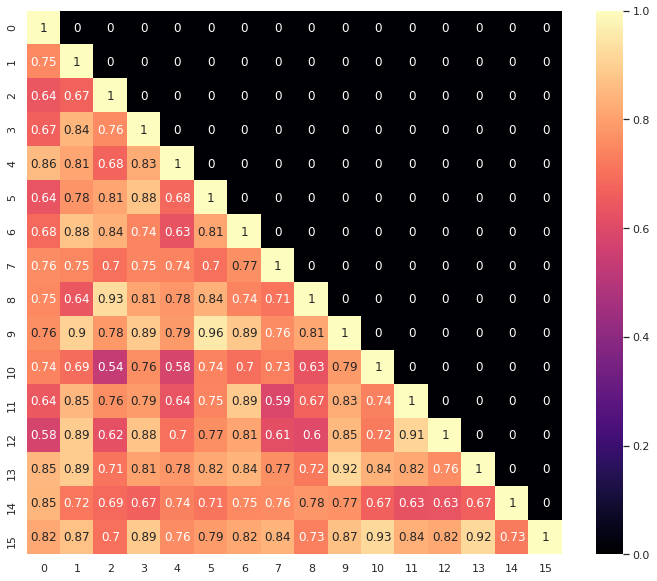

In [288]:
sns.set(rc={'figure.figsize':(12,10)})
hm = sns.heatmap(similarity_matrix.tril(), annot=True, cmap='magma')

In [289]:
import wandb

In [291]:
img = wandb.Image(hm)

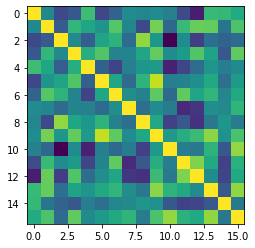

In [256]:
plt.imshow(similarity_matrix)

In [131]:
a = F.softmax(torch.tensor([1.,2,3]), dim=-1)
a

tensor([0.0900, 0.2447, 0.6652])

In [132]:
b = F.log_softmax(torch.tensor([1.,2,3]), dim=-1)
b

tensor([-2.4076, -1.4076, -0.4076])

<BarContainer object of 10 artists>

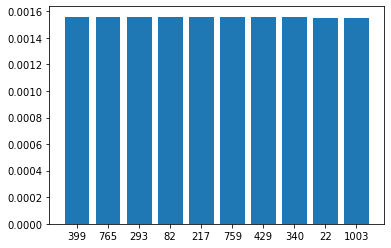

In [59]:
plt.bar(range(vals.shape[1]), vals.flatten(), tick_label=inds.flatten())

In [60]:
a = torch.softmax(torch.rand(32, 1024), dim=-1)

In [63]:
vals, inds = a.median(dim=0)

In [64]:
vals

tensor([0.0009, 0.0010, 0.0008,  ..., 0.0009, 0.0009, 0.0010])

<BarContainer object of 1024 artists>

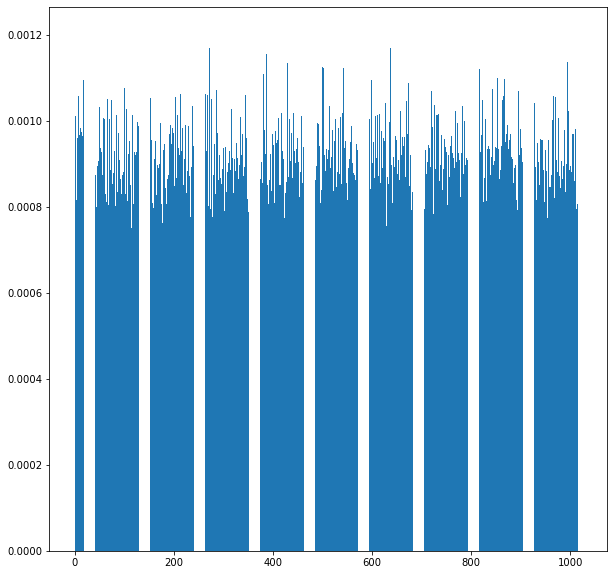

In [86]:
fig = plt.figure(figsize=(10,10))
plt.bar(range(len(vals)), vals)

In [93]:
import PIL
from torchvision import transforms

In [96]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]
 
inv_normalise = transforms.Normalize(
   mean= [-m/s for m, s in zip(mean, std)],
   std= [1/s for s in std]
)

In [97]:
normalise = transforms.Normalize(mean, std)

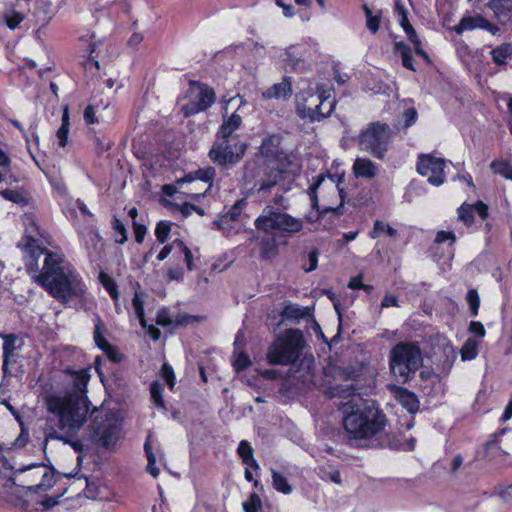

In [102]:
img

In [101]:
norm = normalise(tsfm(img))

In [103]:
unnorm = inv_normalize(norm)

In [114]:
batch = torch.stack(img_list)

In [122]:
img = to_pil(make_grid(batch[:5], n_row=1))

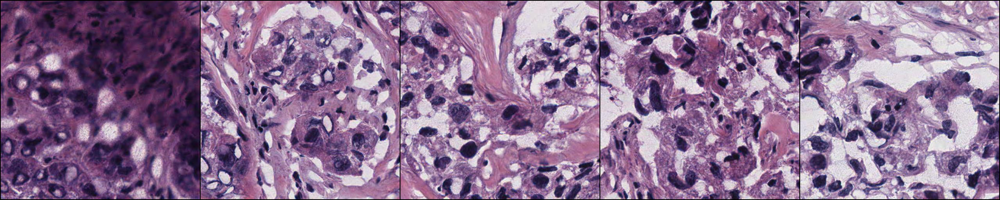

In [123]:
img

In [125]:
import einops

In [127]:
import argparse
import os
import sys
import datetime
import time
import math
import json
from pathlib import Path

import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.distributed as dist
import torch.backends.cudnn as cudnn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision import models as torchvision_models
import torchvision

import utils
import vision_transformer as vits
from vision_transformer import DINOHead

import wandb

In [128]:
class DataAugmentationDINO(object):
    def __init__(self, global_crops_scale, local_crops_scale, local_crops_number, mean, std):
        flip_and_color_jitter = transforms.Compose([
            transforms.RandomVerticalFlip(p=0.5), 
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomApply(
                [transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1)],
                p=0.8
            ),
            transforms.RandomGrayscale(p=0.2),
        ])
        normalize = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean, std),
        ])

        # first global crop
        self.global_transfo1 = transforms.Compose([
            transforms.RandomResizedCrop(224, scale=global_crops_scale, interpolation=Image.BICUBIC),
            flip_and_color_jitter,
            utils.GaussianBlur(1.0),
            normalize,
        ])
        # second global crop
        self.global_transfo2 = transforms.Compose([
            transforms.RandomResizedCrop(224, scale=global_crops_scale, interpolation=Image.BICUBIC),
            flip_and_color_jitter,
            utils.GaussianBlur(0.1),
            utils.Solarization(0.2),
            normalize,
        ])
        # transformation for the local small crops
        self.local_crops_number = local_crops_number
        self.local_transfo = transforms.Compose([
            transforms.RandomResizedCrop(96, scale=local_crops_scale, interpolation=Image.BICUBIC),
            flip_and_color_jitter,
            utils.GaussianBlur(p=0.5),
            normalize,
        ])

    def __call__(self, image):
        crops = []
        crops.append(self.global_transfo1(image))
        crops.append(self.global_transfo2(image))
        for _ in range(self.local_crops_number):
            crops.append(self.local_transfo(image))
        return crops

In [194]:
arch = 'vit_small'
patch_size = 8
out_dim = 65536
use_bn_in_head = False
norm_last_layer = True

global_crops_scale = (0.5, 1.)
local_crops_scale = (0.05, 0.4)
local_crops_number = 8

mean = [0.485, 0.456, 0.406] 
std = [0.229, 0.224, 0.225]
data_path = "/home/niklas/Internal_HDD/project_data/histopathology/CPTAC/CPTAC_BRCA/tiles"

batch_size_per_gpu = 16
num_workers = 8
device = 'cuda'

checkpoint_key = 'teacher'
pretrained_weights = "/home/niklas/Internal_HDD/project_data/histopathology/model_weights/dino_checkpoints/dino_deitsmall8_pretrain_full_checkpoint.pth"

In [195]:
mean_normalisation = mean if len(mean) == 3 else 3*(mean[0],)
std_normalisation  = std if len(std) == 3 else 3*(std[0],)

transform = DataAugmentationDINO(
    global_crops_scale,
    local_crops_scale,
    local_crops_number,
    mean_normalisation,
    std_normalisation
)
dataset = datasets.ImageFolder(data_path, transform=transform)
data_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=batch_size_per_gpu,
    num_workers=num_workers,
    pin_memory=True,
    drop_last=True,
)

In [201]:
[n for n,_ in model.named_parameters()]

['cls_token',
 'pos_embed',
 'patch_embed.proj.weight',
 'patch_embed.proj.bias',
 'blocks.0.norm1.weight',
 'blocks.0.norm1.bias',
 'blocks.0.attn.qkv.weight',
 'blocks.0.attn.qkv.bias',
 'blocks.0.attn.proj.weight',
 'blocks.0.attn.proj.bias',
 'blocks.0.norm2.weight',
 'blocks.0.norm2.bias',
 'blocks.0.mlp.fc1.weight',
 'blocks.0.mlp.fc1.bias',
 'blocks.0.mlp.fc2.weight',
 'blocks.0.mlp.fc2.bias',
 'blocks.1.norm1.weight',
 'blocks.1.norm1.bias',
 'blocks.1.attn.qkv.weight',
 'blocks.1.attn.qkv.bias',
 'blocks.1.attn.proj.weight',
 'blocks.1.attn.proj.bias',
 'blocks.1.norm2.weight',
 'blocks.1.norm2.bias',
 'blocks.1.mlp.fc1.weight',
 'blocks.1.mlp.fc1.bias',
 'blocks.1.mlp.fc2.weight',
 'blocks.1.mlp.fc2.bias',
 'blocks.2.norm1.weight',
 'blocks.2.norm1.bias',
 'blocks.2.attn.qkv.weight',
 'blocks.2.attn.qkv.bias',
 'blocks.2.attn.proj.weight',
 'blocks.2.attn.proj.bias',
 'blocks.2.norm2.weight',
 'blocks.2.norm2.bias',
 'blocks.2.mlp.fc1.weight',
 'blocks.2.mlp.fc1.bias',
 'bloc

In [198]:
model = vits.__dict__[arch](patch_size=patch_size, num_classes=0)
for p in model.parameters():
    p.requires_grad = False
model.eval()
model.to(device)
if os.path.isfile(pretrained_weights):
    state_dict = torch.load(pretrained_weights, map_location="cpu")
    
    if checkpoint_key is not None and checkpoint_key in state_dict:
        print(f"Take key {checkpoint_key} in provided checkpoint dict")
        state_dict = state_dict[checkpoint_key]
    
    # remove `module.` prefix
    state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}
    # remove `backbone.` prefix induced by multicrop wrapper
    state_dict = {k.replace("backbone.", ""): v for k, v in state_dict.items()}
    msg = model.load_state_dict(state_dict, strict=False)
    print('Pretrained weights found at {} and loaded with msg: {}'.format(pretrained_weights, msg))

Take key teacher in provided checkpoint dict
Pretrained weights found at /home/niklas/Internal_HDD/project_data/histopathology/model_weights/dino_checkpoints/dino_deitsmall8_pretrain_full_checkpoint.pth and loaded with msg: _IncompatibleKeys(missing_keys=[], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2.weight', 'head.mlp.2.bias', 'head.mlp.4.weight', 'head.mlp.4.bias', 'head.last_layer.weight_g', 'head.last_layer.weight_v'])


In [178]:
student = vits.__dict__[arch](
            patch_size=patch_size,
            drop_path_rate=0.1,  # stochastic depth
        )
teacher = vits.__dict__[arch](patch_size=patch_size)
embed_dim = student.embed_dim

In [180]:
for p in student.parameters():
    p.requires_grad = False
student.eval()
student.to(device)

state_dict = torch.load(pretrained_weights, map_location="cpu")

# remove `module.` prefix
state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}
# remove `backbone.` prefix induced by multicrop wrapper
state_dict = {k.replace("backbone.", ""): v for k, v in state_dict.items()}
msg = student.load_state_dict(state_dict, strict=False)
print('Pretrained weights found at {} and loaded with msg: {}'.format(pretrained_weights, msg))

Pretrained weights found at /home/niklas/Internal_HDD/project_data/histopathology/model_weights/dino_checkpoints/dino_deitsmall8_pretrain_full_checkpoint.pth and loaded with msg: _IncompatibleKeys(missing_keys=['cls_token', 'pos_embed', 'patch_embed.proj.weight', 'patch_embed.proj.bias', 'blocks.0.norm1.weight', 'blocks.0.norm1.bias', 'blocks.0.attn.qkv.weight', 'blocks.0.attn.qkv.bias', 'blocks.0.attn.proj.weight', 'blocks.0.attn.proj.bias', 'blocks.0.norm2.weight', 'blocks.0.norm2.bias', 'blocks.0.mlp.fc1.weight', 'blocks.0.mlp.fc1.bias', 'blocks.0.mlp.fc2.weight', 'blocks.0.mlp.fc2.bias', 'blocks.1.norm1.weight', 'blocks.1.norm1.bias', 'blocks.1.attn.qkv.weight', 'blocks.1.attn.qkv.bias', 'blocks.1.attn.proj.weight', 'blocks.1.attn.proj.bias', 'blocks.1.norm2.weight', 'blocks.1.norm2.bias', 'blocks.1.mlp.fc1.weight', 'blocks.1.mlp.fc1.bias', 'blocks.1.mlp.fc2.weight', 'blocks.1.mlp.fc2.bias', 'blocks.2.norm1.weight', 'blocks.2.norm1.bias', 'blocks.2.attn.qkv.weight', 'blocks.2.attn.

In [145]:
student = utils.MultiCropWrapper(student, DINOHead(
        embed_dim,
        out_dim,
        use_bn=use_bn_in_head,
        norm_last_layer=norm_last_layer,
    ))
teacher = utils.MultiCropWrapper(
    teacher,
    DINOHead(embed_dim, out_dim, use_bn_in_head),
)

In [25]:
from utils import load_pretrained_weights
import vision_transformer as vits
from vision_transformer import DINOHead
import utils
import torch

In [31]:
model = vits.__dict__['vit_small'](patch_size=8, num_classes=0)

In [32]:
model = utils.MultiCropWrapper(model, DINOHead(
        model.embed_dim,
        65536,
        use_bn=False,
        norm_last_layer=True,
))

In [20]:
pretrained_weights = '/home/niklas/Internal_HDD/project_data/histopathology/model_weights/dino_checkpoints/dino_deitsmall8_pretrain_full_checkpoint.pth'

In [26]:
state_dict = torch.load(pretrained_weights, map_location="cpu")

In [29]:
teacher_state_dict = state_dict['teacher']

In [39]:
model.load_state_dict(teacher_state_dict)

<All keys matched successfully>